# Imports

In [3]:
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import pandas as pd
sns.set()

sns.set_style("whitegrid")
flatui = ["#9b59b6","#3498db","#95a5a6","#e74c3c","#34495e","#2ecc71"]
sns.set_palette(flatui) 
sns.set(font_scale=1.5)

font = {'weight' : 'bold',
        'size'   : 24}

matplotlib.rc('font', **font)

%matplotlib inline

In [4]:
df_raw = pd.read_csv('../data/data_raw.csv')
df_raw['SUBJECT'] = df_raw['SUBJECT'].astype('category')
df_raw['AUTHOR'] = df_raw['AUTHOR'].astype('category')

# Texts by Authors

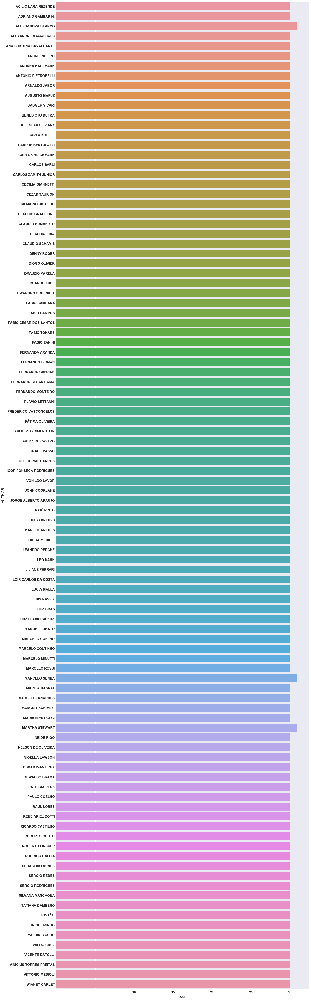

In [5]:
f, ax = plt.subplots(figsize=(20, 80))
sns.countplot(y="AUTHOR", data=df_raw);

# Text By Subject

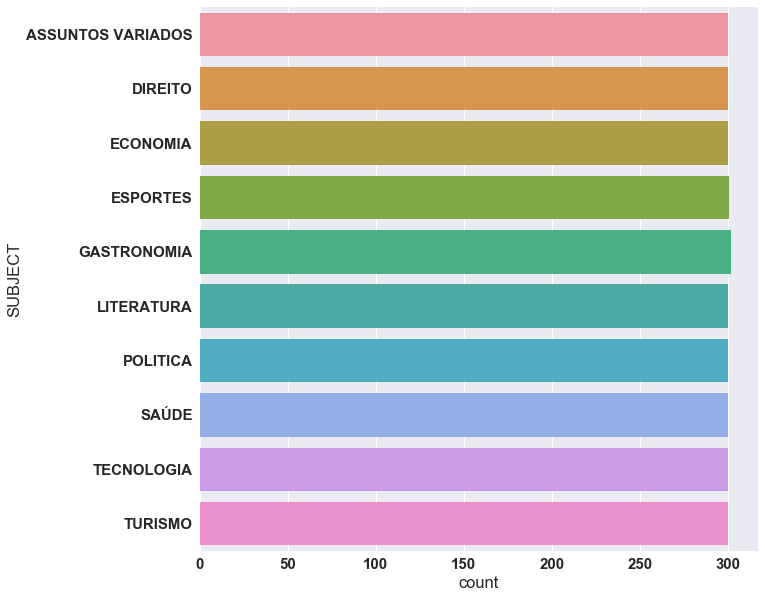

In [6]:
f, ax = plt.subplots(figsize=(10, 10))
sns.countplot(y="SUBJECT", data=df_raw);

# Features Distribuitions

In [7]:
df_feat = pd.read_csv('../data/data_feat.csv')

In [11]:
df_feat.head()

,SUBJECT,AUTHOR,TEXT,TEXT_CLEAN,NUM_STOPWORDS,NUM_PUNCTUATIONS,NUM_WORDS_UPPER,NUM_CHARS,NUM_WORDS,AVG_WORD
0,ASSUNTOS VARIADOS,LUIZ FLAVIO SAPORI,19/03/2009\nFATO CORRIQUEIRO\nO fato mais impo...,19 03 2009 fato corriqueiro fato importante se...,67,29,5,1375,199,5.787129
1,ASSUNTOS VARIADOS,LUIZ FLAVIO SAPORI,06/07/2009\nPOLÍTICA DE ESTADO\nUm problema cr...,06 07 2009 politica estado problema cronico po...,75,29,11,1342,207,5.449275
2,ASSUNTOS VARIADOS,LUIZ FLAVIO SAPORI,12/07/2009\nTOQUE DE RECOLHER\nProcurado para ...,12 07 2009 toque recolher procurado suspender ...,95,46,11,1587,257,5.180392
3,ASSUNTOS VARIADOS,LUIZ FLAVIO SAPORI,23/03/2009\nCRISE SOCIOEDUCATIVA\nOcorreram du...,23 03 2009 crise socioeducativa ocorreram duas...,55,26,6,1141,167,5.761905
4,ASSUNTOS VARIADOS,LUIZ FLAVIO SAPORI,24/12/2008\nESTATÍSTICAS CRIMINAIS CONFIÁVEIS\...,24 12 2008 estatisticas criminais confiaveis b...,133,43,17,2309,366,5.246612


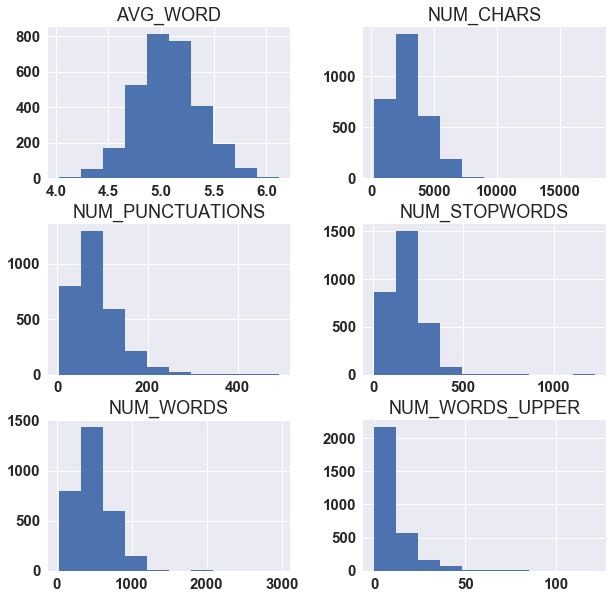

In [8]:
df_feat.hist(figsize=(10,10));

/Users/thiagovieira/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


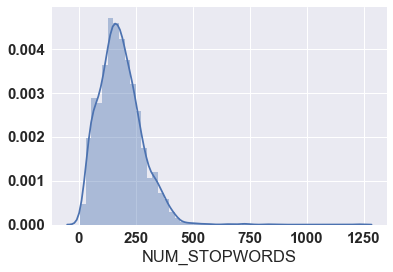

In [19]:
sns.distplot(df_feat['NUM_STOPWORDS'])

/Users/thiagovieira/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


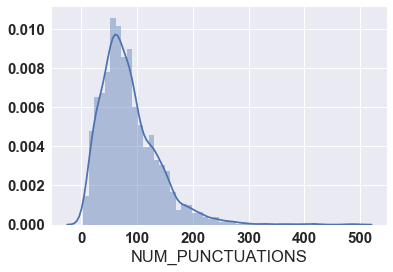

In [20]:
sns.distplot(df_feat['NUM_PUNCTUATIONS'])

/Users/thiagovieira/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


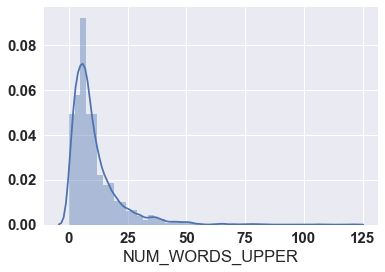

In [21]:
sns.distplot(df_feat['NUM_WORDS_UPPER'])

/Users/thiagovieira/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


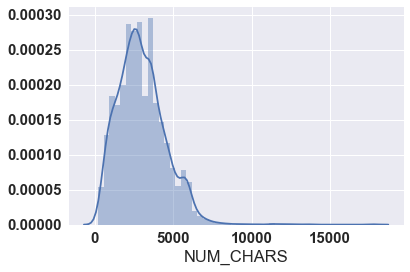

In [22]:
sns.distplot(df_feat['NUM_CHARS'])

/Users/thiagovieira/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


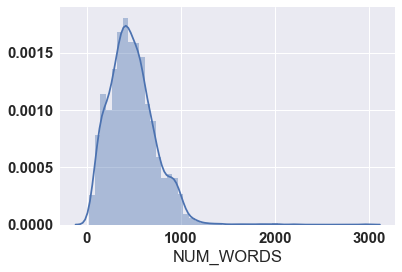

In [23]:
sns.distplot(df_feat['NUM_WORDS'])

/Users/thiagovieira/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


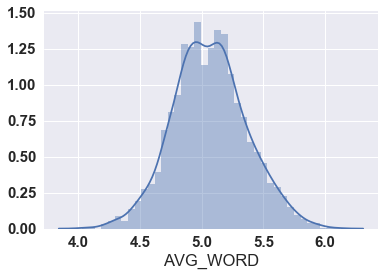

In [24]:
sns.distplot(df_feat['AVG_WORD'])

In [ ]:
sns.distplot(df_feat['NUM_WORDS'])

# Wordcloud

In [25]:
from wordcloud import WordCloud as wc
def generate_wordcloud(text):
    wordcloud = wc(width=800, height=400, background_color="white").generate(text)
    fig,ax = plt.subplots(1,1,figsize=(20,20))
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis("off")
    ax.margins(x=0, y=0)
    plt.show()

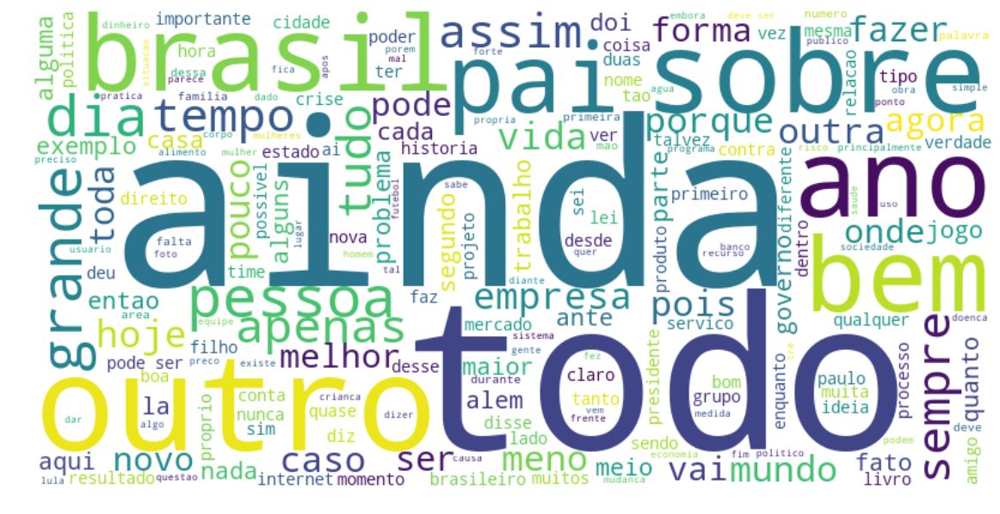

In [26]:
text = ' '.join(df_feat['TEXT_CLEAN'])
generate_wordcloud(text)

## Most relevant tfidf features

In [31]:
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk import word_tokenize

tfidf_vec = TfidfVectorizer(analyzer='word',tokenizer=word_tokenize)
tfidf = tfidf_vec.fit_transform(df_feat['TEXT_CLEAN'])
print(tfidf.shape)

(3003, 69492)


In [32]:
feature_names=tfidf_vec.get_feature_names()

In [37]:
import numpy as np

def top_tfidf_feats(row, features, top_n=25):
    ''' Get top n tfidf values in row and return them with their corresponding feature names.'''
    topn_ids = np.argsort(row)[::-1][:top_n]
    top_feats = [(features[i], row[i]) for i in topn_ids]
    df = pd.DataFrame(top_feats)
    df.columns = ['feature', 'tfidf']
    return df

def top_feats_in_doc(Xtr, features, row_id, top_n=25):
    ''' Top tfidf features in specific document (matrix row) '''
    row = np.squeeze(Xtr[row_id].toarray())
    return top_tfidf_feats(row, features, top_n)

def top_mean_feats(Xtr, features, grp_ids=None, min_tfidf=0.1, top_n=25):
    ''' Return the top n features that on average are most important amongst documents in rows
        indentified by indices in grp_ids. '''
    if grp_ids:
        D = Xtr[grp_ids].toarray()
    else:
        D = Xtr.toarray()

    D[D < min_tfidf] = 0
    tfidf_means = np.mean(D, axis=0)
    return top_tfidf_feats(tfidf_means, features, top_n)


In [38]:
def top_feats_by_class(Xtr, y, features, min_tfidf=0.1, top_n=500):
    ''' Return a list of dfs, where each df holds top_n features and their mean tfidf value
        calculated across documents with the same class label. '''
    dfs = []
    labels = np.unique(y)
    for label in labels:
        ids = np.where(y==label)
        feats_df = top_mean_feats(Xtr, features, ids, min_tfidf=min_tfidf, top_n=top_n)
        feats_df.label = label
        dfs.append(feats_df)
    return dfs

dfs = top_feats_by_class(tfidf, df_feat['SUBJECT'], feature_names)

ASSUNTOS VARIADOS


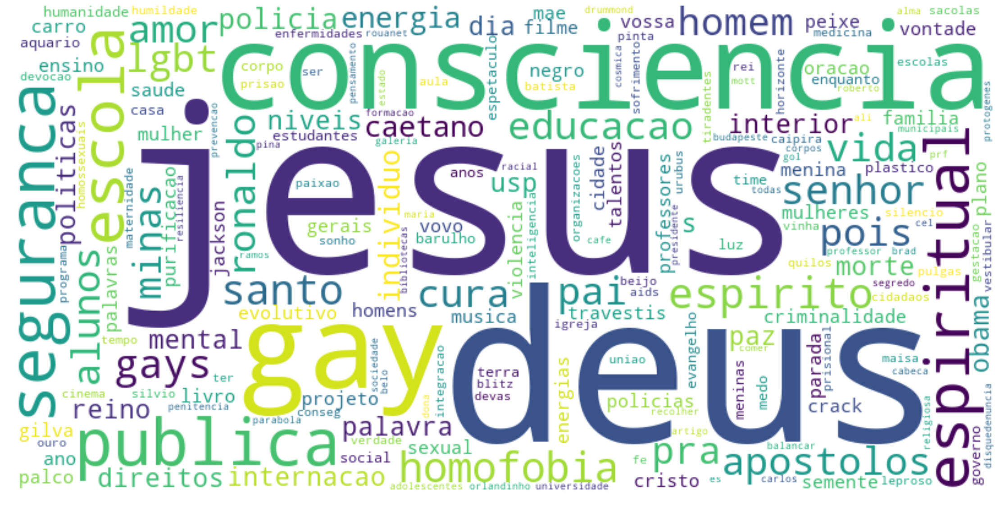

DIREITO


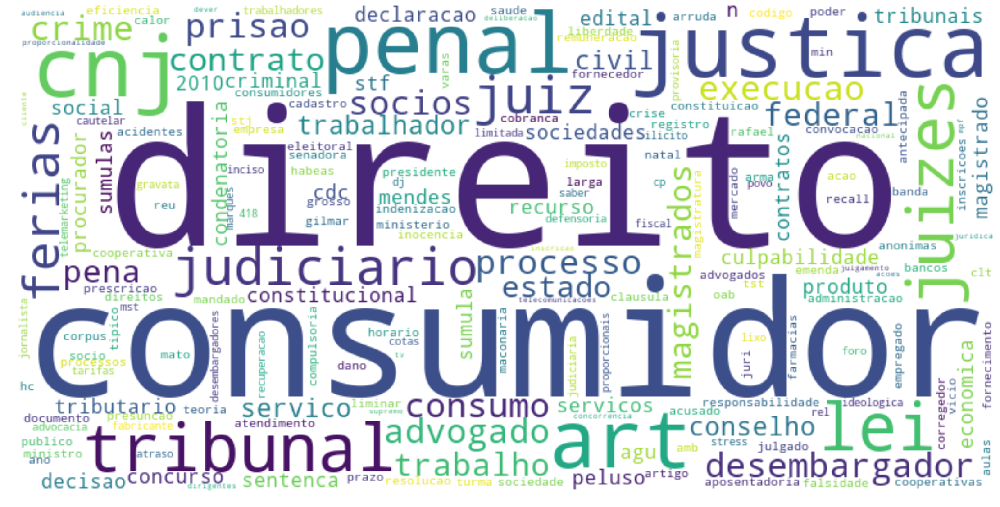

ECONOMIA


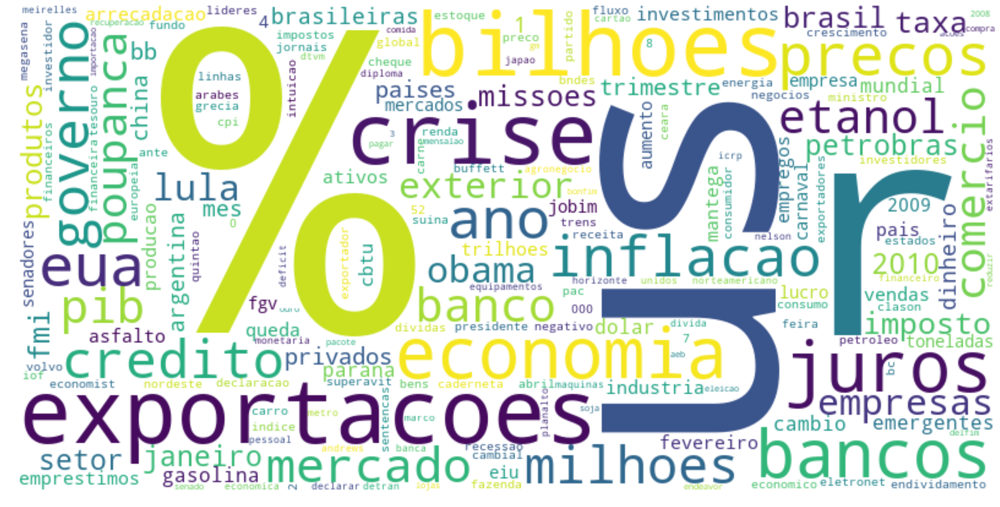

ESPORTES


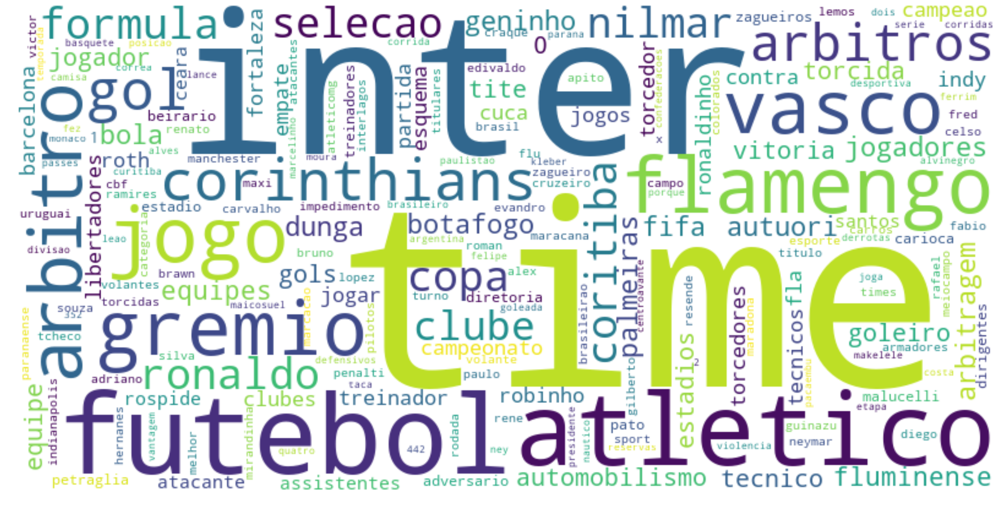

GASTRONOMIA


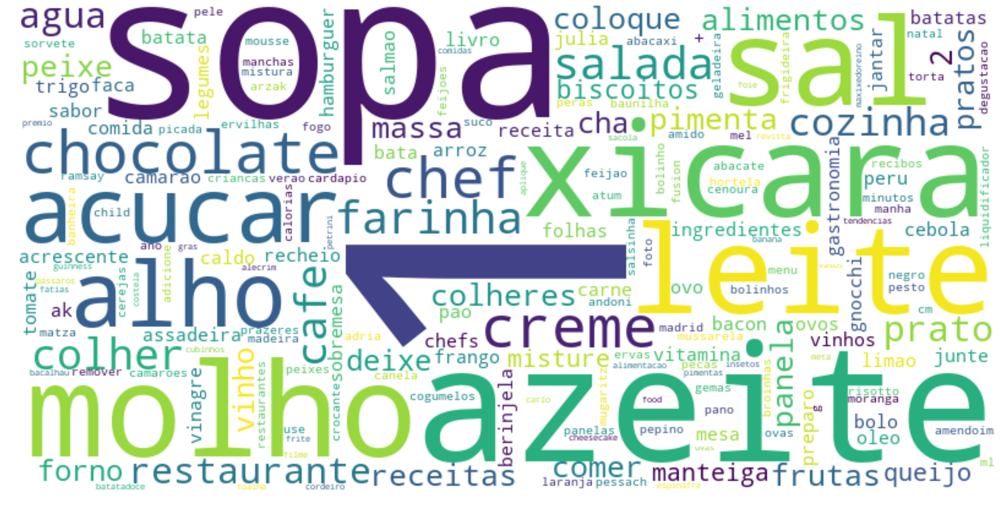

LITERATURA


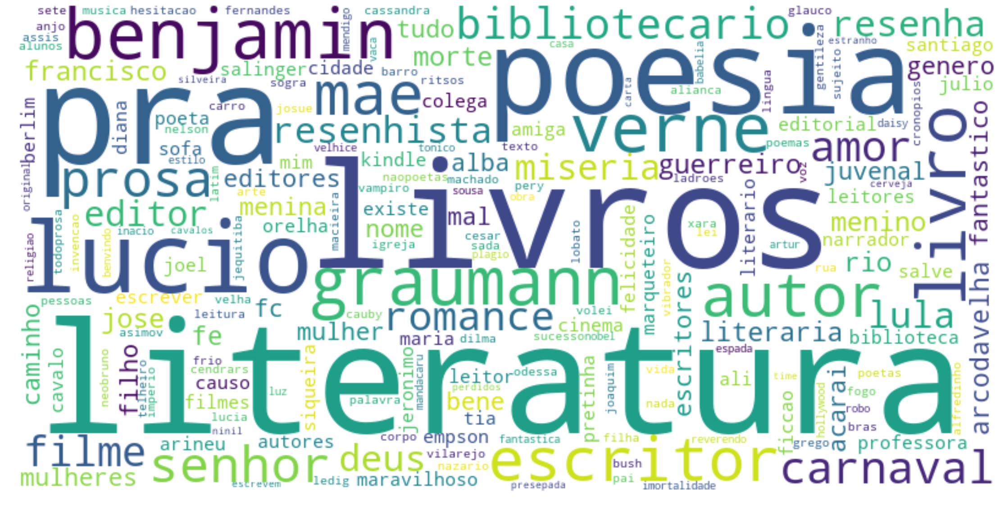

POLITICA


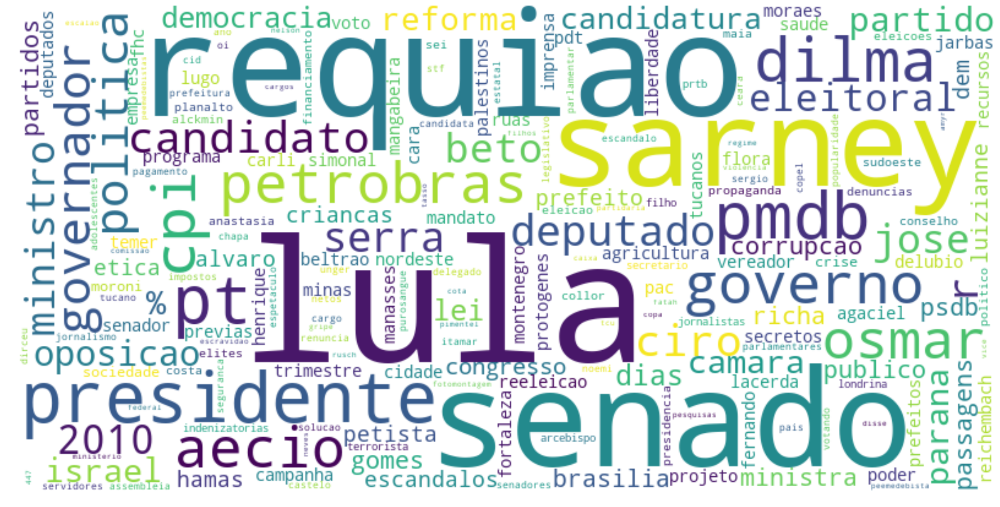

SAÚDE


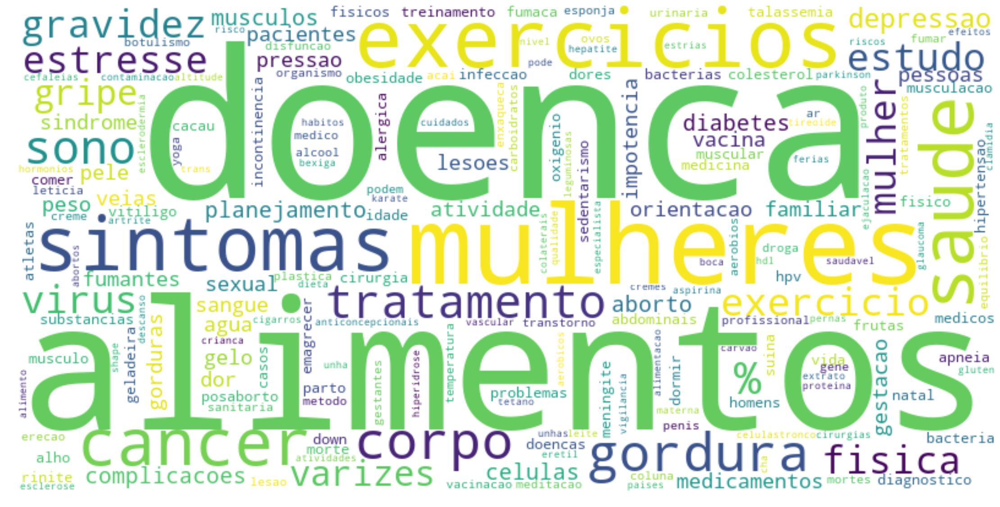

TECNOLOGIA


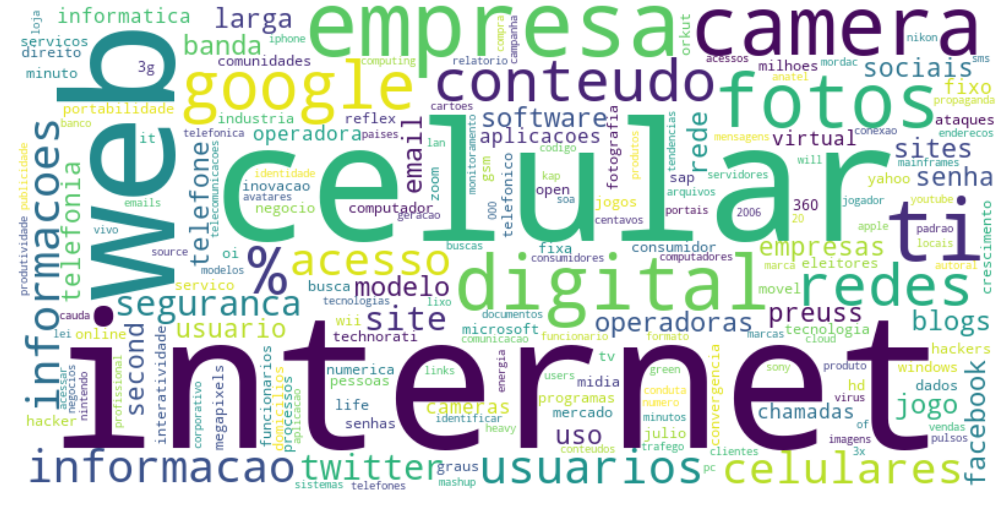

TURISMO


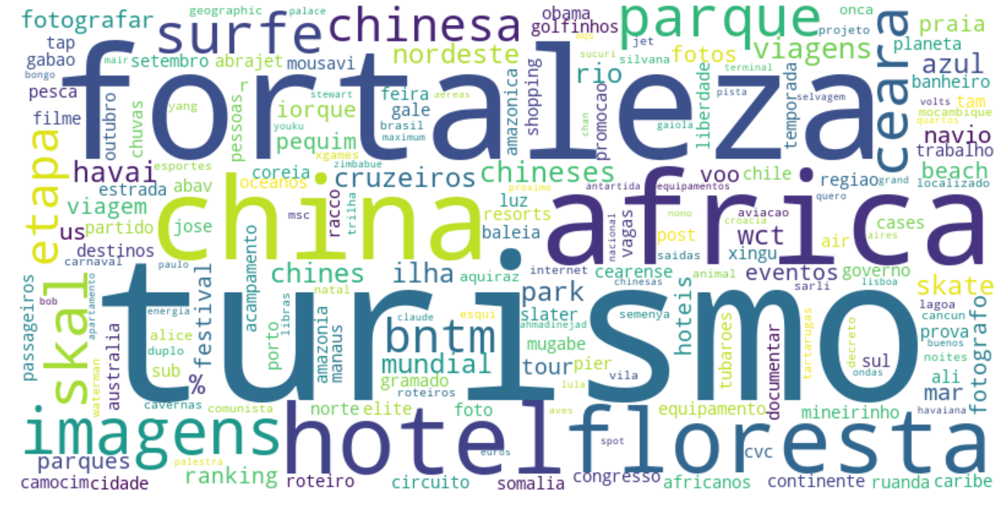

In [40]:
for df in dfs:
    print(df.label)
    d = {}
    for k,v in df.iterrows():
        d[v.feature] = v.tfidf

    import matplotlib.pyplot as plt
    from wordcloud import WordCloud

    wordcloud = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(frequencies=d)
    plt.figure(figsize=[40,20])
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")

    #plt.savefig("wordcloud_ai.png", format="png")
    plt.show()